In [2]:
#import data manipulation packages 
import pandas as pd 
import numpy as np 
import os
import cv2
import matplotlib.pyplot as plt
import warnings

In [3]:
#import deep learning tools 
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing import image, image_dataset_from_directory
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow import keras
import tensorflow

In [4]:
tensorflow.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


False

In [6]:
# Set the seed value for experiment reproducibility.
seed = 1842
tensorflow.random.set_seed(seed)
np.random.seed(seed)
# Turn off warnings for cleaner looking notebook
warnings.simplefilter('ignore')

## Load in the Data

In [7]:
#define image dataset 
#why do we rescale?
image_generator = ImageDataGenerator(rescale=1/255, validation_split=0.2) #shear_range =.25, zoom_range =.2, horizontal_flip = True, rotation_range=20)     

#Train & Validation Split 
train_dataset = image_generator.flow_from_directory(batch_size=32,
                                                 directory='data_cleaned/Train',
                                                 shuffle=True,
                                                 target_size=(224, 224), 
                                                 subset="training",
                                                 class_mode='categorical')

validation_dataset = image_generator.flow_from_directory(batch_size=32,
                                                 directory='data_cleaned/Train',
                                                 shuffle=True,
                                                 target_size=(224, 224), 
                                                 subset="validation",
                                                 class_mode='categorical')

#Organize data for our predictions 
image_generator_submission = ImageDataGenerator(rescale=1/255) 
submission = image_generator_submission.flow_from_directory(
                                                 directory='data_cleaned/scraped_images',
                                                 shuffle=False,
                                                 target_size=(224, 224), 
                                                 class_mode=None)

Found 430 images belonging to 2 classes.
Found 106 images belonging to 2 classes.
Found 100 images belonging to 1 classes.


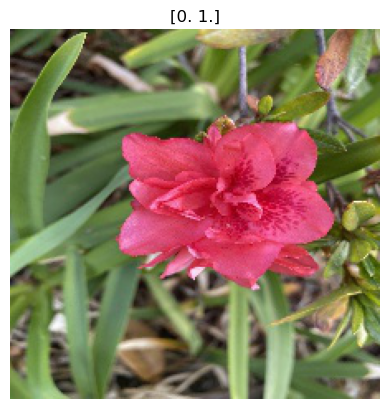

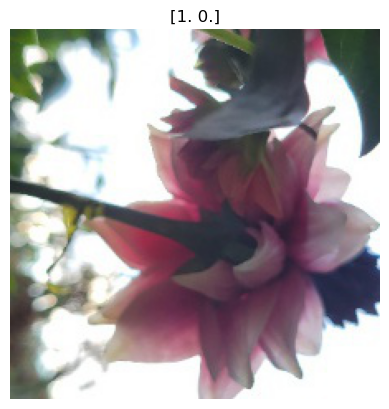

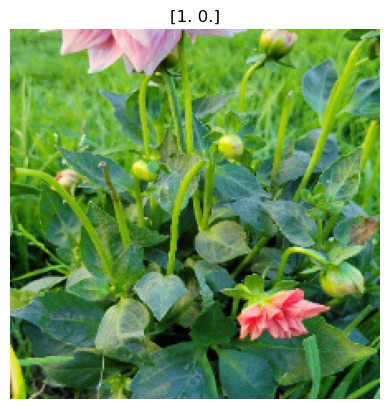

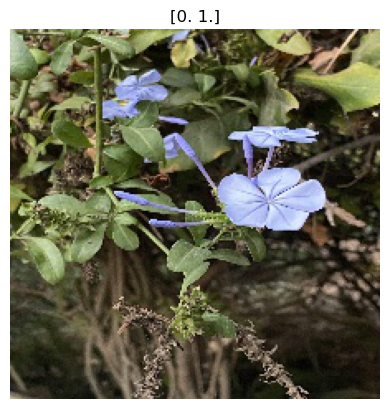

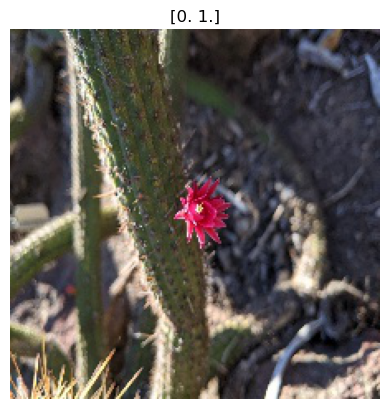

...

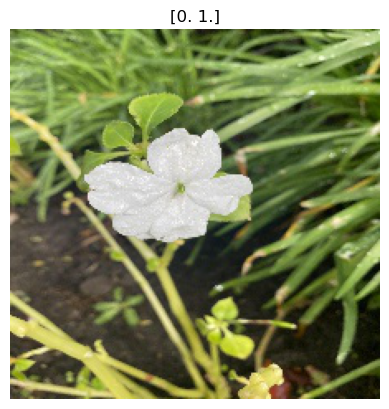

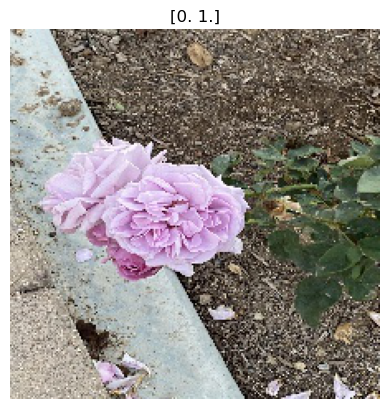

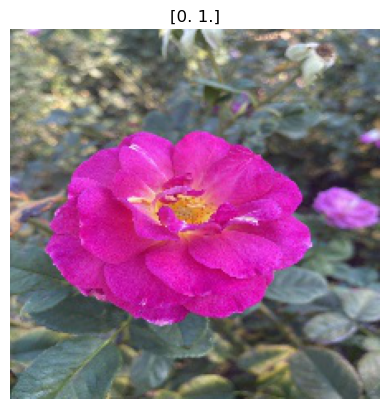

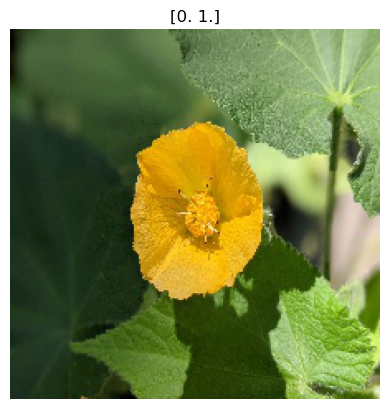

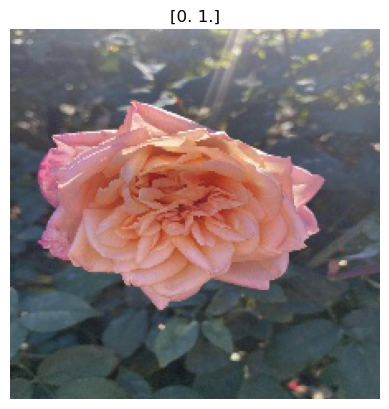

In [8]:
#show flowers for the first batch
batch_1_img = train_dataset[0]
for i in range(0,32):
    img = batch_1_img[0][i]
    lab = batch_1_img[1][i]
    plt.imshow(img)
    plt.title(lab)
    plt.axis('off')
    plt.show()

## Build The First Classifier (CNN) 

In [9]:
model = keras.Sequential([
    keras.layers.Conv2D(64, 3, activation='relu', input_shape=(224, 224, 3)),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(32, 3, activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.Conv2D(16, 3, activation='relu'),
    keras.layers.MaxPooling2D(),
    keras.layers.Dropout(0.5),
    keras.layers.Flatten(),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(2, activation='softmax')
])

model.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

callback = keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=3,
        restore_best_weights=True
)

In [10]:
model.fit(train_dataset, epochs=20, validation_data=validation_dataset, callbacks=callback)

Epoch 1/20


14/14 [==============================] - 17s 898ms/step - loss: 0.6106 - accuracy: 0.6721 - val_loss: 0.5893 - val_accuracy: 0.7075
Epoch 2/20
14/14 [==============================] - 12s 836ms/step - loss: 0.5362 - accuracy: 0.7047 - val_loss: 0.5867 - val_accuracy: 0.7075
Epoch 3/20
14/14 [==============================] - 10s 701ms/step - loss: 0.4570 - accuracy: 0.7186 - val_loss: 0.5077 - val_accuracy: 0.7358
Epoch 4/20
14/14 [==============================] - 10s 719ms/step - loss: 0.4035 - accuracy: 0.8070 - val_loss: 0.4899 - val_accuracy: 0.8019
Epoch 5/20
14/14 [==============================] - 10s 673ms/step - loss: 0.3460 - accuracy: 0.8767 - val_loss: 0.3791 - val_accuracy: 0.8208
Epoch 6/20
14/14 [==============================] - 10s 691ms/step - loss: 0.2572 - accuracy: 0.9140 - val_loss: 0.2354 - val_accuracy: 0.9245
Epoch 7/20
14/14 [==============================] - 10s 676ms/step - loss: 0.1703 - accuracy: 0.9488 - val_loss: 0.1758 - val_accuracy: 0.90

In [11]:
loss, accuracy = model.evaluate(validation_dataset)
print("Loss: ", loss)
print("Accuracy: ", accuracy)

4/4 [==============================] - 1s 177ms/step - loss: 0.1538 - accuracy: 0.9528
Loss:  0.15380263328552246
Accuracy:  0.9528301954269409


In [12]:
model.predict(submission)

4/4 [==============================] - 1s 202ms/step


array([[2.35722589e-04, 9.99764264e-01],
       [4.38928373e-06, 9.99995589e-01],
       [3.82504477e-05, 9.99961734e-01],
       [1.69345810e-07, 9.99999881e-01],
       [1.26831978e-07, 9.99999881e-01],
       [6.15976576e-04, 9.99384046e-01],
       [5.90291014e-03, 9.94097114e-01],
       [3.12402267e-06, 9.99996901e-01],
       [1.07237608e-09, 1.00000000e+00],
       [1.13058917e-03, 9.98869359e-01],
       [8.54946091e-04, 9.99145031e-01],
       [4.03072988e-07, 9.99999642e-01],
       [2.80018374e-02, 9.71998215e-01],
       [7.19677814e-07, 9.99999285e-01],
       [5.31404316e-01, 4.68595654e-01],
       [7.19182968e-01, 2.80817002e-01],
       [2.67728684e-08, 1.00000000e+00],
       [5.23176268e-02, 9.47682440e-01],
       [6.60100241e-09, 1.00000000e+00],
       [9.99997377e-01, 2.66619645e-06],
       [1.46004243e-03, 9.98539925e-01],
       [1.13340333e-08, 1.00000000e+00],
       [3.09001392e-04, 9.99691010e-01],
       [5.68487849e-07, 9.99999404e-01],
       [1.344905

## Augmented images

In [13]:
data_augmented = keras.Sequential([
    keras.layers.experimental.preprocessing.RandomFlip('horizontal', input_shape=(224, 224, 3)),
    keras.layers.experimental.preprocessing.RandomRotation(0.1),
    keras.layers.experimental.preprocessing.RandomRotation(0.1),
    keras.layers.experimental.preprocessing.RandomZoom(0.1),
    keras.layers.experimental.preprocessing.RandomContrast(0.1)
])

In [14]:
model_a = keras.Sequential([data_augmented, model])

model_a.compile(
    optimizer='adam',
    loss='binary_crossentropy',
    metrics=['accuracy']
)

In [15]:
model_a.fit(train_dataset, epochs=20, validation_data=validation_dataset, callbacks=callback)

Epoch 1/20
14/14 [==============================] - 19s 971ms/step - loss: 0.3524 - accuracy: 0.8558 - val_loss: 0.1127 - val_accuracy: 0.9528
Epoch 2/20
14/14 [==============================] - 11s 766ms/step - loss: 0.2088 - accuracy: 0.9233 - val_loss: 0.1375 - val_accuracy: 0.9623
Epoch 3/20
14/14 [==============================] - 11s 763ms/step - loss: 0.2027 - accuracy: 0.9233 - val_loss: 0.1523 - val_accuracy: 0.9623
Epoch 4/20
14/14 [==============================] - 11s 768ms/step - loss: 0.2009 - accuracy: 0.9279 - val_loss: 0.4566 - val_accuracy: 0.8679


In [16]:
loss, accuracy = model_a.evaluate(validation_dataset)
print("Loss: ", loss)
print("Accuracy: ", accuracy)

4/4 [==============================] - 1s 200ms/step - loss: 0.1127 - accuracy: 0.9528
Loss:  0.1127060204744339
Accuracy:  0.9528301954269409


In [17]:
model_a.predict(submission)

4/4 [==============================] - 1s 168ms/step


array([[4.21560777e-04, 9.99578416e-01],
       [5.73212162e-07, 9.99999404e-01],
       [1.01520571e-04, 9.99898434e-01],
       [1.64626397e-06, 9.99998331e-01],
       [2.24591918e-06, 9.99997735e-01],
       [4.23812680e-03, 9.95761931e-01],
       [3.90877873e-02, 9.60912228e-01],
       [1.42433612e-06, 9.99998569e-01],
       [9.22422760e-09, 1.00000000e+00],
       [6.30132738e-04, 9.99369919e-01],
       [9.06943285e-04, 9.99093056e-01],
       [5.92724632e-07, 9.99999404e-01],
       [1.05084799e-01, 8.94915223e-01],
       [3.47582727e-07, 9.99999642e-01],
       [1.75005004e-01, 8.24994922e-01],
       [2.04617843e-01, 7.95382202e-01],
       [3.37432056e-07, 9.99999642e-01],
       [2.88787007e-01, 7.11212993e-01],
       [4.99846209e-09, 1.00000000e+00],
       [9.99985218e-01, 1.47541141e-05],
       [4.07816516e-03, 9.95921850e-01],
       [2.20234170e-07, 9.99999762e-01],
       [9.27780566e-05, 9.99907255e-01],
       [8.21764297e-06, 9.99991775e-01],
       [4.001408

## Finding Best Model Architecture (Keras Tuner)

In [20]:
pip install keras-tuner

Note: you may need to restart the kernel to use updated packages.


In [22]:
final_data = []
final_labels = []

for i in range(0,len(train_dataset)):
    batch = train_dataset[i]
    for j in range(len(batch[0])):
        final_data.append(batch[0][j])
        final_labels.append(batch[1][j])

val_data = []
val_labels = []

for i in range(0,len(validation_dataset)):
    batch = validation_dataset[i]
    for j in range(len(batch[0])):
        val_data.append(batch[0][j])
        val_labels.append(batch[1][j])
        

        
final_data = np.array(final_data)
final_labels = np.array(final_labels)
val_data = np.array(val_data)
val_labels = np.array(val_labels)

In [24]:
from kerastuner.tuners import RandomSearch

def build_model(hp):
    model = keras.Sequential([data_augmented])
    model.add(keras.layers.AveragePooling2D(4,2))
    
    for i in range(hp.Int("Conv Layers", min_value=0, max_value=3)):
        model.add(keras.layers.Conv2D(hp.Choice(f"layer_{i}_filters", [16,32,64]), 3, activation='relu'))
        model.add(keras.layers.MaxPool2D((3,3)))

    #model.add(keras.layers.MaxPool2D())
    model.add(keras.layers.Dropout(0.5))
    model.add(keras.layers.Flatten())

    model.add(keras.layers.Dense(hp.Choice("Dense layer", [64, 128, 256]), activation='relu'))

    model.add(keras.layers.Dense(2, activation='softmax'))

    model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

    return model

tuner = RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=32,
)

tuner.search(final_data, final_labels, validation_data=(val_data, val_labels), epochs=20)

Trial 32 Complete [00h 00m 59s]
val_loss: 0.11059489101171494

Best val_loss So Far: 0.07496768236160278
Total elapsed time: 00h 31m 16s


In [25]:
best_model = tuner.get_best_models()[0]

In [26]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 224, 224, 3)       0         
                                                                 
 average_pooling2d (Average  (None, 111, 111, 3)       0         
 Pooling2D)                                                      
                                                                 
 conv2d (Conv2D)             (None, 109, 109, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 36, 36, 64)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 34, 34, 64)        36928     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 11, 11, 64)        0

In [27]:
loss, accuracy = best_model.evaluate(validation_dataset)

print("LOSS", loss)
print("ACCURACY", accuracy)

4/4 [==============================] - 1s 132ms/step - loss: 0.0750 - accuracy: 0.9906
LOSS 0.07496768236160278
ACCURACY 0.9905660152435303


# Optional stuff

In [ ]:
onlyfiles = [f.split('.')[0] for f in os.listdir(os.path.join('data_cleaned/scraped_images/image_files')) if os.path.isfile(os.path.join(os.path.join('data_cleaned/scraped_images/image_files'), f))]
submission_df = pd.DataFrame(onlyfiles, columns =['images'])
submission_df[['la_eterna','other_flower']] = best_model.predict(submission)
submission_df.head()

In [ ]:
submission_df.to_csv('submission_file.csv', index = False)